In [27]:
from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb
import tensorflow as tf
from PIL import Image
from matplotlib import ticker
from sklearn import metrics
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# For reproducability
SEED = 51432
tf.keras.utils.set_random_seed(SEED)
tf.config.experimental.enable_op_determinism()

# Customize matplotlib graphs
plt.rc("axes.spines", right=False, top=False)
plt.rc("font", family="serif", size=10.5)

La détection précoce du cancer est cruciale pour garantir les meilleures chances de guérison. L'apprentissage automatique peut potentiellement permettre un diagnostic rapide et évolutif.

## Objectif

> *Créer un outil de diagnostic qui utilise des modèles d'apprentissage en profondeur pour distinguer les tumeurs bénignes des tumeurs malignes (cancéreuses) du sein, en utilisant des images histopathologiques.*

## Source de données

La [Breast Cancer Histopathological Database (BreakHis)][breakhis]

>Spanhol, F., Oliveira, L. S., Petitjean, C., Heutte, L., A Dataset for Breast Cancer Histopathological Image Classification, IEEE Transactions on Biomedical Engineering (TBME), 63(7):1455-1462, 2016.
>
><https://www.inf.ufpr.br/lesoliveira/download/TBME-00608-2015-R2-preprint.pdf>

Le jeu de données est composé de 7 909 images microscopiques de tissus tumoraux du sein collectées à partir de 82 patients à différents facteurs de grossissement :

| Magnification   |   Benign |   Malignant |   Total |
|:----------------|---------:|------------:|--------:|
| 40X             |      652 |        1370 |    1995 |
| 100X            |      644 |        1437 |    2081 |
| 200X            |      623 |        1390 |    2013 |
| 400X            |      588 |        1232 |    1820 |
| Total Images    |     2480 |        5429 |    7909 |


Les échantillons ont été obtenus via [surgical open biopsy][sob], et soumis à:

- *fixation*, *dehydration*, *clearing*, *infiltration*, *embedding*, and *trimming*
- precision *slicing* to 3μm sections using a microtome
- *staining* with hematoxylin and eosin, then covered with a glass coverslip
- *visual inspection* under a microscope by anatomopathologists to identify tumoral areas
- final *diagnosis* of each case by experienced pathologists
- confirmation by *complementary exams* such as immunohistochemistry analysis
- digital photography

[breakhis]: https://web.inf.ufpr.br/vri/databases/breast-cancer-histopathological-database-breakhis/
[sob]: https://en.wikipedia.org/wiki/Breast_biopsy#Excisional_(surgical)_biopsy

# Analyse exploratoire des données


Le fichier `Folds.csv` décrit une stratégie de validation croisée en 5-fold conçue de telle sorte que les images d'entraînement et de test proviennent de personnes différentes :

In [29]:
fold_info = pd.read_csv("C:/Users/aggou/Downloads/archive/Folds.csv")
fold_info["label"] = fold_info["filename"].str.extract("(malignant|benign)")
fold_info.head()

,fold,mag,grp,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,benign


Chaque fold contient les 7 909 images disponibles. Nous utiliserons le deuxième fold pour cette étude, car il a la proportion la plus élevée d'images d'entraînement :

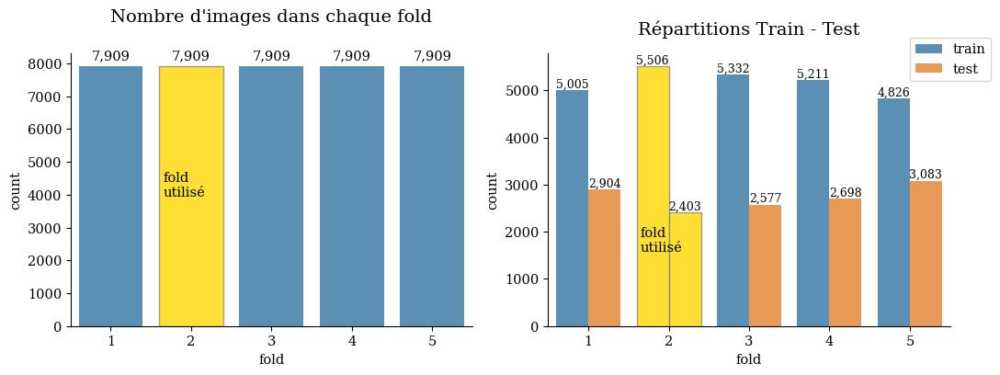

In [30]:
selected_fold = 2
selected_fold_data = fold_info.query("fold == @selected_fold").copy()
selected_fold_data["filename"] = ("C:/Users/aggou/Downloads/archive/BreaKHis_v1/"
                                  + selected_fold_data["filename"])
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(11, 4.2), tight_layout=True)
# Plot image count in each fold
sb.countplot(data=fold_info, x="fold", color="C0", ax=ax1, alpha=0.8)
bars = ax1.containers[0]
ax1.bar_label(bars, padding=3,
             labels=[f"{x:,.0f}" for x in bars.datavalues])
_selected_bar = bars[selected_fold - 1]
_selected_bar.set_facecolor("gold")
_selected_bar.set_edgecolor("#888")
ax1.text(_selected_bar.get_x() + 0.05, _selected_bar.get_height() / 2,
         "fold\nutilisé")
ax1.set_title("Nombre d'images dans chaque fold", size=14, pad=25)

# Plot train-test split
sb.countplot(data=fold_info, x="fold", hue="grp", palette="tab10",
              ax=ax2, alpha=0.8)
for bars in ax2.containers:
    ax2.bar_label(bars, [f"{x:,.0f}" for x in bars.datavalues], size=9)
    bars[selected_fold - 1].set_facecolor("gold")
    bars[selected_fold - 1].set_edgecolor("#888")
ax2.text(_selected_bar.get_x() + 0.05, _selected_bar.get_height() / 5,
         "fold\nutilisé")
ax2.set_title("Répartitions Train - Test", size=14, pad=15)
ax2.legend(loc=(0.9, 0.9));

## Facteurs de grossissement

[Travaux antérieurs][magnf-article],
>Ashtaiwi, A. *Optimal Histopathological Magnification Factors for Deep Learning-Based Breast Cancer Prediction*. Appl. Syst. Innov. 2022, 5, 87. https://doi.org/10.3390/asi5050087

a établi que l'entraînement des modèles sur des images avec un facteur de grossissement d'au moins **_200X_** donne les meilleurs résultats.

Considérez les images suivantes de l'ID de diapositive 22549AB à différents facteurs de grossissement :

[magnf-article]: https://www.mdpi.com/2571-5577/5/5/87

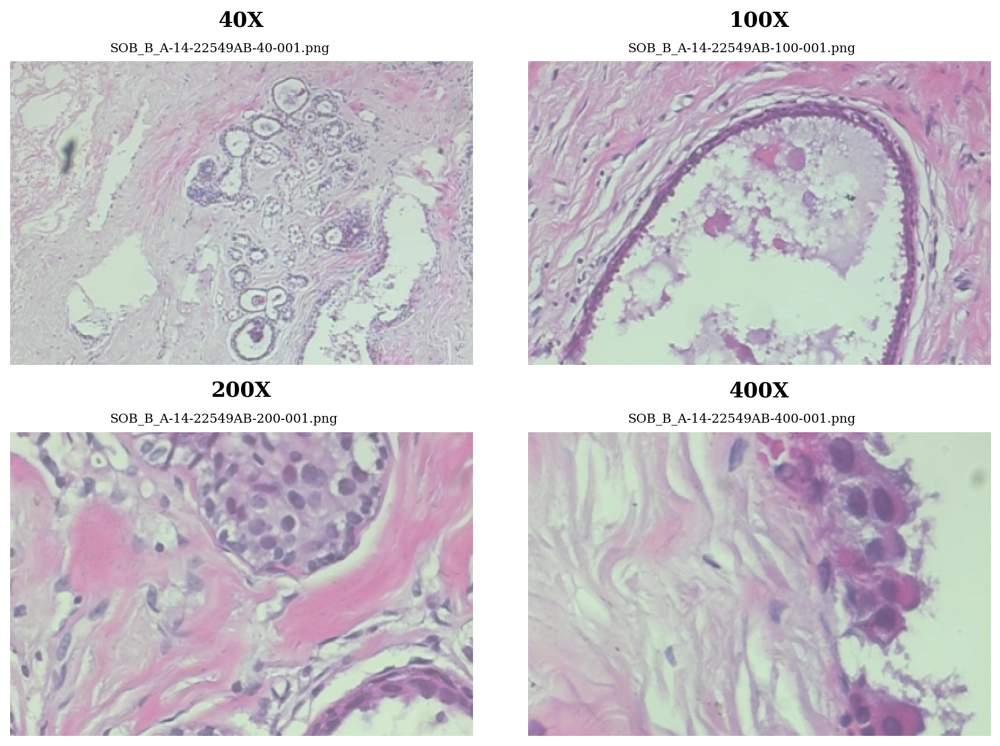

In [31]:
fig, axes = plt.subplots(2, 2, figsize=(11, 7.5), dpi=180, tight_layout=True)
sample_images = selected_fold_data.groupby("mag", as_index=False).first()
for ax, row in zip(axes.flat, sample_images.itertuples()):
    img = Image.open(row.filename)
    ax.imshow(img)
    ax.set_title(f"{row.mag}X", size=15, pad=25, weight=600)
    ax.text(150, -15, row.filename.split("/")[-1], size=9)
    ax.axis("off")

In [32]:
# Use data in selected fold (2) with magnification factor >= 200X
train = selected_fold_data.query("mag >= 200 and grp == 'train'")
test = selected_fold_data.query("mag >= 200 and grp == 'test'")
train.shape, test.shape

((2682, 5), (1151, 5))

## Répartition de la cible

Le jeu de données est déséquilibré. Il y a significativement plus d'images de cas malins que d'images de cas *benign*.

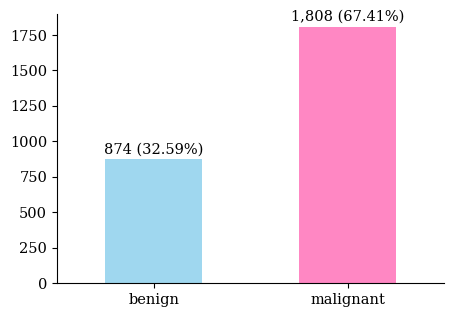

In [33]:
classes = dict(benign=0, malignant=1)
class_names = list(classes.keys())
label_counts = train["label"].value_counts(ascending=True)
ax = label_counts.plot.bar(color=["skyblue", "hotpink"], alpha=0.8,
                           figsize=(5, 3.5))
ax.bar_label(ax.containers[0], padding=2,
             labels=[f"{x:,} ({x/len(train):.2%})" for x in label_counts])
ax.set_xticklabels(["benign", "malignant"], rotation=0);

En cas de déséquilibre de classe dans un problème de classification, la précision n'est pas une métrique fiable ; il devient facile d'obtenir une précision élevée en prédisant simplement plus de cas de la classe majoritaire.

À titre d'illustration, un classificateur prédisant uniquement des cas malins (1) obtiendrait un score de précision de 67,41 % ici, sans jamais identifier aucun cas bénin. Mais ce même modèle n'obtiendrait qu'un score ROC-AUC de 50 % (aléatoire, pas meilleur que le hasard).

In [34]:
y = train["label"].map(classes)
positive_only_preds = np.ones_like(y)
print(f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2%}",
      f"\nROC-AUC:  {metrics.roc_auc_score(y, positive_only_preds):.2%}")

Accuracy: 67.41% 
ROC-AUC:  50.00%


 

Nous utiliserons donc l'[ROC-AUC][roc] et une [matrice de confusion][cmat] pour l'évaluation du modèle.

[cmat]: https://en.wikipedia.org/wiki/Confusion_matrix
[roc]: https://en.wikipedia.org/wiki/Receiver_operating_characteristic

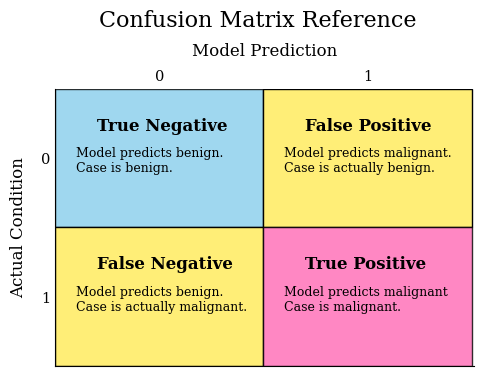

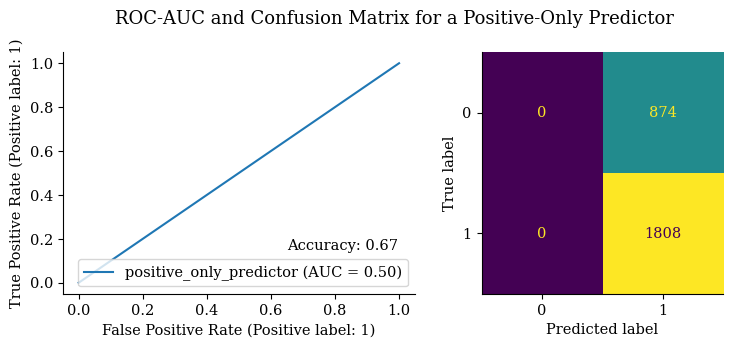

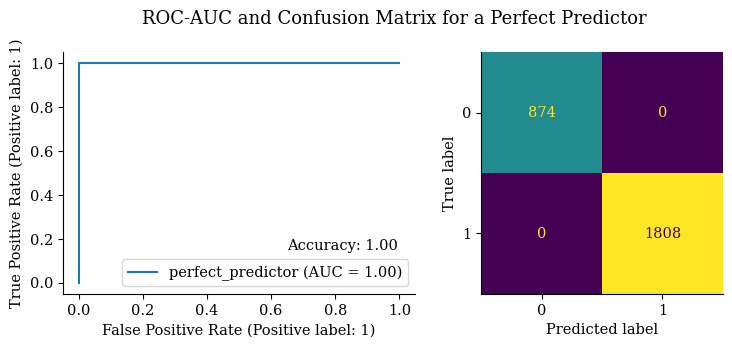

In [35]:
# Draw a confusion matrix with descriptions
fig, ax = plt.subplots(figsize=(5.4, 3.6))
ax.axvspan(0, 0.5, 0.5, 1, facecolor="skyblue", alpha=0.8, edgecolor="black")
ax.axvspan(0.5, 1, 0.5, 1, facecolor="#fe7", edgecolor="black")
ax.axvspan(0, 0.5, 0, 0.5, facecolor="#fe7", edgecolor="black")
ax.axvspan(0.5, 1, 0, 0.5, facecolor="hotpink", alpha=0.8, edgecolor="black")
ax.text(0.1, 0.85, "True Negative", size=12, weight=600)
ax.text(0.05, 0.7, "Model predicts benign.\nCase is benign.", size=9)
ax.text(0.6, 0.85, "False Positive", size=12, weight=600)
ax.text(0.55, 0.7, "Model predicts malignant.\nCase is actually benign.", size=9)
ax.text(0.1, 0.35, "False Negative", size=12, weight=600)
ax.text(0.05, 0.2, "Model predicts benign.\nCase is actually malignant.", size=9)
ax.text(0.6, 0.35, "True Positive", size=12, weight=600)
ax.text(0.55, 0.2, "Model predicts malignant\nCase is malignant.", size=9)
ax.set_xlim(0, 1.005)
ax.xaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.xaxis.set_ticklabels([0, 1])
ax.yaxis.set_major_locator(ticker.FixedLocator([0.25, 0.75]))
ax.yaxis.set_ticklabels([1, 0])
ax.set_ylabel("Actual Condition", size=12, labelpad=10)
ax.set_xlabel("Model Prediction", size=12, labelpad=10)
ax.xaxis.set_label_position("top")
ax.xaxis.set_ticks_position("top")
ax.spines["left"].set_position("zero")
ax.tick_params(pad=0, top=False, left=False)
fig.suptitle("Confusion Matrix Reference", y=1.1, size=16)

# Plot metrics for positive-only-predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, positive_only_preds, ax=ax1,
                                         name="positive_only_predictor")
metrics.ConfusionMatrixDisplay.from_predictions(y, positive_only_preds,
                                                ax=ax2, colorbar=False)
ax1.text(0.65, 0.15,
         f"Accuracy: {metrics.accuracy_score(y, positive_only_preds):.2f}")
fig.suptitle("ROC-AUC and Confusion Matrix for a Positive-Only Predictor", size=13)

# Plot metrics for "perfect" predictor
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(8, 3.5), tight_layout=True)
metrics.RocCurveDisplay.from_predictions(y, y, ax=ax1, name="perfect_predictor")
ax1.text(0.65, 0.15, f"Accuracy: {metrics.accuracy_score(y, y):.2f}")
metrics.ConfusionMatrixDisplay.from_predictions(y, y, ax=ax2, colorbar=False)
fig.suptitle("ROC-AUC and Confusion Matrix for a Perfect Predictor", size=13);

# Ingestion de données et prétraitement

Les images doivent être converties en forme numérique pour être utilisées par les modèles de vision par ordinateur.

Nous utiliserons le module d'image [TensorFlow][tf-image] pour :

charger les fichiers d'image PNG
décoder les images et les convertir en tenseurs 3D
redimensionner les images à une taille uniforme (certaines ont 760x460 pixels tandis que d'autres ont 760x456).

[tf-image]: https://www.tensorflow.org/api_docs/python/tf/image

In [36]:
IMG_SIZE = 224
BATCH_SIZE = 24


def load_image(filename: str, label: int) -> Tuple[tf.Tensor, str]:
    file = tf.io.read_file(filename)
    img = tf.image.decode_png(file, channels=3)
    img = tf.image.resize_with_pad(img, IMG_SIZE, IMG_SIZE)
    return img, label


# Prepare training and validation datasets
X_train, X_valid, y_train, y_valid = train_test_split(
    train["filename"], train["label"].map(classes), random_state=SEED
)
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))\
             .map(load_image).batch(BATCH_SIZE)
validation_ds = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))\
                  .map(load_image).batch(BATCH_SIZE)
# Prepare test dataset
test = test.sample(frac=1, random_state=SEED)  # shuffle test data
test_ds = tf.data.Dataset.from_tensor_slices(
    (test["filename"], test["label"].map(classes))
).map(load_image).batch(BATCH_SIZE)

# Cache and prefetch data for faster training
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(961).prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

Jetons un coup d'œil à quelques-unes des images :

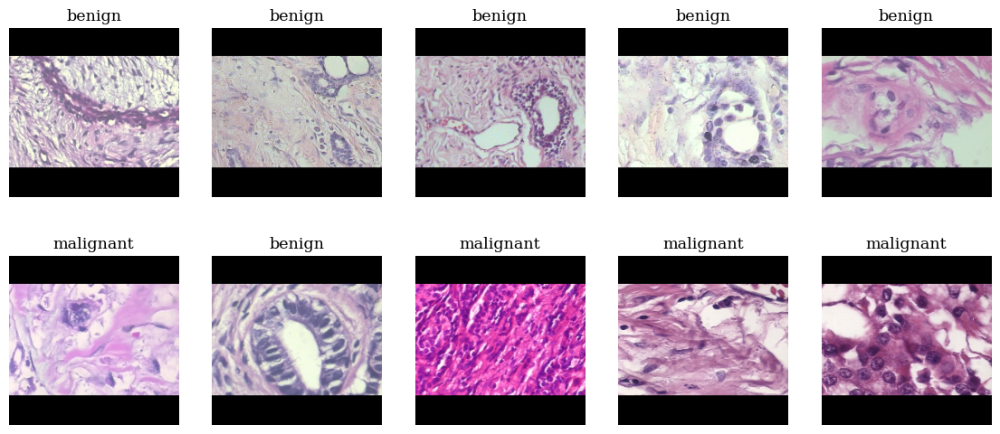

In [37]:
plt.figure(figsize=(14, 6))
for images, labels in train_ds.take(1):
    labels = labels.numpy()    
    for i in range(10):
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(images[i].numpy().astype(np.uint8))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## Augmentation de données

L'[augmentation de données][data-aug] est une technique pour augmenter la quantité de données d'entraînement en ajoutant des copies légèrement modifiées ou de nouvelles données synthétiques.

Cela a l'avantage supplémentaire de rendre les modèles robustes aux variations dans les images. Par exemple, les modèles exposés à des images tournées pourraient apprendre que l'orientation n'est pas importante lors de l'identification des cellules cancéreuses.

Les méthodes utilisées ici incluent :

Des variations aléatoires de la luminosité (pour aider à gérer les conditions d'éclairage variables).
Des retournements aléatoires horizontaux et verticaux (pour aider à gérer les différentes orientations).
Des rotations aléatoires (pour aider également à gérer les différentes orientations).

[data-aug]: https://en.wikipedia.org/wiki/Data_augmentation

In [38]:
sample_image = load_image(*train[["filename", "label"]].iloc[0])[0]


def plot_augmentations(augmentation_layer: tf.keras.layers.Layer) -> None:
    augment_name = augmentation_layer.name
    fig, (ax0, *axes) = plt.subplots(ncols=4, figsize=(15, 4))
    ax0.imshow(sample_image.numpy().astype("uint8"))
    ax0.set_title("Original", size=14, pad=10)
    ax0.axis("off")
    for idx, ax in enumerate(axes):
        augmented_image = augmentation_layer(sample_image)
        ax.imshow(augmented_image.numpy().astype("uint8"))
        ax.set_title(augment_name.title(), size=14, pad=10)
        ax.axis("off")

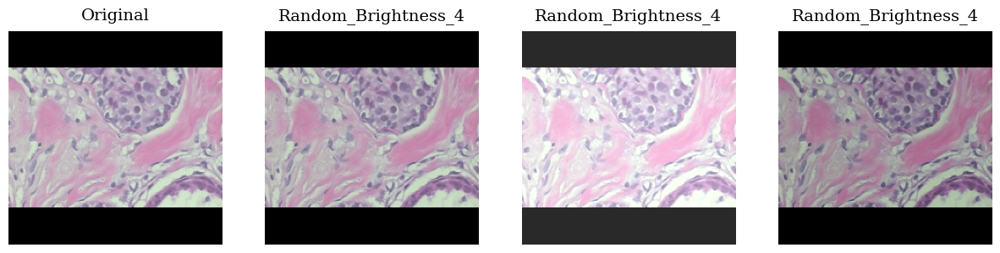

In [39]:
plot_augmentations(layers.RandomBrightness(0.2))

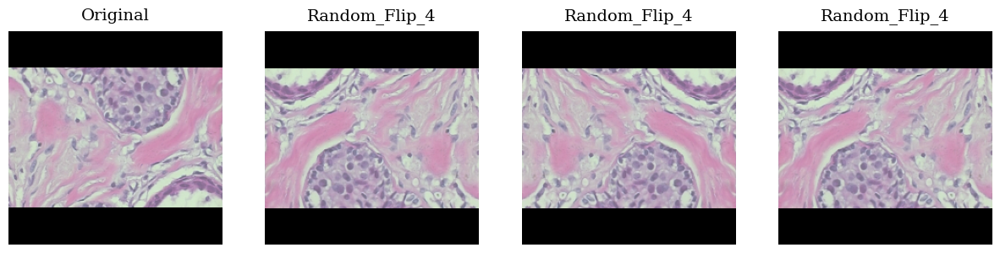

In [40]:
plot_augmentations(layers.RandomFlip())

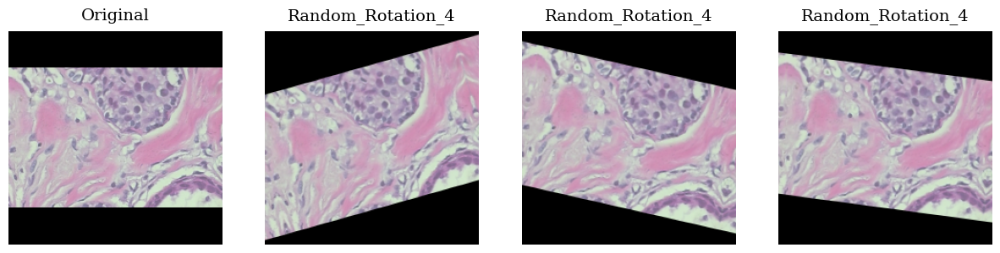

In [41]:
plot_augmentations(layers.RandomRotation(0.2, seed=SEED))

## Fonctions d'aide

In [42]:
MAX_EPOCHS = 100
BASE_LEARNING_RATE = 0.0005


def compile_and_fit_model(
    model: tf.keras.Model, learning_rate: float=BASE_LEARNING_RATE
) -> tf.keras.callbacks.History:
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate),
        loss=tf.keras.losses.BinaryCrossentropy(),
        metrics=[tf.keras.metrics.AUC(name="roc_auc"), "binary_accuracy"]
    )
    early_stopping = EarlyStopping(min_delta=1e-4, patience=5, verbose=1,
                                   restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(factor=0.5, patience=4, verbose=1)
    history = model.fit(train_ds, validation_data=validation_ds,
                        epochs=MAX_EPOCHS, callbacks=[early_stopping, reduce_lr])
    # Plot training metrics
    performance_df = pd.DataFrame(history.history)
    fig, axes = plt.subplots(ncols=2, figsize=(11, 4))
    for ax, metric in zip(axes.flat, ["Accuracy", "Loss"]):
        performance_df.filter(like=metric.lower()).plot(ax=ax)
        ax.set_title(metric, size=14, pad=10)
        ax.set_xlabel("epoch")
    return history


def evaluate_model(model: tf.keras.Model, dataset: tf.data.Dataset=test_ds) -> None:
    loss, auc, accuracy = model.evaluate(dataset, verbose=0)
    print(f"\nROC-AUC:   {auc:.5f}", 
          f"Accuracy:  {accuracy:.5f}",
          f"Loss:      {loss:.5f}\n", sep="\n")
    # Get labels and predictions for each batch in dataset
    results = [(labels, model.predict(images, verbose=0).reshape(-1))
               for images, labels in dataset.take(-1)]
    labels = np.concatenate([x[0] for x in results])
    preds = np.concatenate([x[1] for x in results])
    # Plot metrics
    fig, axes = plt.subplots(ncols=3, figsize=(15, 4), dpi=160)
    curves = [metrics.RocCurveDisplay, metrics.PrecisionRecallDisplay]
    for ax, curve in zip(axes[:2], curves):
        curve.from_predictions(labels, preds, ax=ax, name=model.name)
    metrics.ConfusionMatrixDisplay.from_predictions(
        labels, preds.round().astype("uint8"), ax=axes[2], colorbar=False,
    )
    titles = ["ROC-AUC Curve", "Precision-Recall Curve", "Confusion Matrix"]
    for ax, title in zip(axes.flat, titles):
        ax.set_title(title, size=14, pad=10)


def plot_predictions(model: tf.keras.Model) -> None:
    plt.figure(figsize=(14, 9))
    for images, labels in test_ds.take(1):
        labels = labels.numpy()
        predicted_labels = model.predict(images).round().astype("uint8").reshape(-1,)
        print("Predicted:", predicted_labels)
        print("Actual:   ", labels)
        for i, (pred, actual) in enumerate(zip(predicted_labels, labels)):
            ax = plt.subplot(4, 7, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            if pred == actual:
                plt.title(class_names[labels[i]], color="green", size=9)
            else:
                plt.title(f"{class_names[predicted_labels[i]]}\n"
                          + f"(Actual: {class_names[labels[i]]})",
                          color="red", size=9)
            plt.axis("off")

# Custom Convolutional Neural Network

Un [réseau de neurones convolutifs] [cnn] (CNN) est une classe de réseaux de neurones artificiels particulièrement adaptée aux problèmes de vision par ordinateur. Il excelle dans la détection de motifs (features) dans les images (voir [introduction aux CNN][cnn-intro]).

[cnn]: https://en.wikipedia.org/wiki/Convolutional_neural_network
[cnn-intro]: https://www.kaggle.com/code/ryanholbrook/the-convolutional-classifier

In [43]:
custom_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # Convolutional block I
    layers.Rescaling(1./255),
    layers.BatchNormalization(),
    layers.Conv2D(32, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    # Convolutional block II
    layers.Conv2D(64, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    # Convolutional block III
    layers.Conv2D(128, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    # Fully connected layers
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(32, activation="relu"),
    layers.Dense(1, activation="sigmoid")
], name="CustomCNN")
custom_model.summary()

Model: "CustomCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness_5 (Random  (None, 224, 224, 3)      0         
 Brightness)                                                     
                                                                 
 random_flip_5 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_5 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 batch_normalization_1 (Batc  (None, 224, 224, 3)      12        
 hNormalization)                                                 
                                                         

Epoch 1/100
84/84 [==============================] - 124s 1s/step - loss: 0.5188 - roc_auc: 0.7853 - binary_accuracy: 0.7593 - val_loss: 0.5544 - val_roc_auc: 0.8740 - val_binary_accuracy: 0.6662 - lr: 5.0000e-04
Epoch 2/100
84/84 [==============================] - 117s 1s/step - loss: 0.4299 - roc_auc: 0.8499 - binary_accuracy: 0.8444 - val_loss: 0.4915 - val_roc_auc: 0.8775 - val_binary_accuracy: 0.7958 - lr: 5.0000e-04
Epoch 3/100
84/84 [==============================] - 117s 1s/step - loss: 0.4142 - roc_auc: 0.8584 - binary_accuracy: 0.8454 - val_loss: 0.4436 - val_roc_auc: 0.8822 - val_binary_accuracy: 0.8450 - lr: 5.0000e-04
Epoch 4/100
84/84 [==============================] - 117s 1s/step - loss: 0.4209 - roc_auc: 0.8526 - binary_accuracy: 0.8404 - val_loss: 0.4289 - val_roc_auc: 0.8854 - val_binary_accuracy: 0.8405 - lr: 5.0000e-04
Epoch 5/100
84/84 [==============================] - 117s 1s/step - loss: 0.4121 - roc_auc: 0.8607 - binary_accuracy: 0.8493 - val_loss: 0.4013 - va

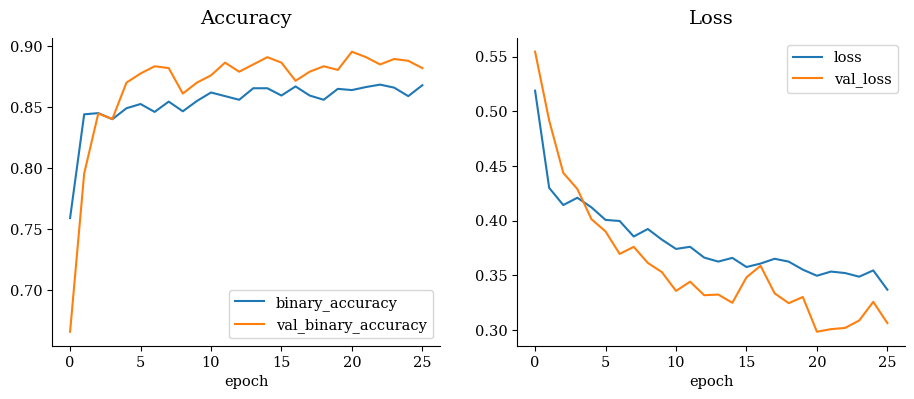

In [44]:
custom_history = compile_and_fit_model(custom_model)


ROC-AUC:   0.85101
Accuracy:  0.85056
Loss:      0.46809



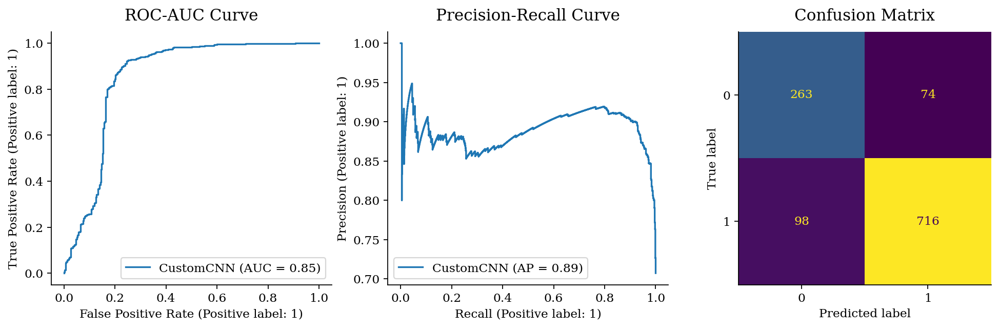

In [45]:
evaluate_model(custom_model)

La performance globale est assez bonne pour un CNN léger entraîné sur des données limitées. Il y a relativement peu de *faux positifs (95)* et de *faux négatifs (63)*.

1/1 [==============================] - 0s 329ms/step
Predicted: [1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0]
Actual:    [1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1]


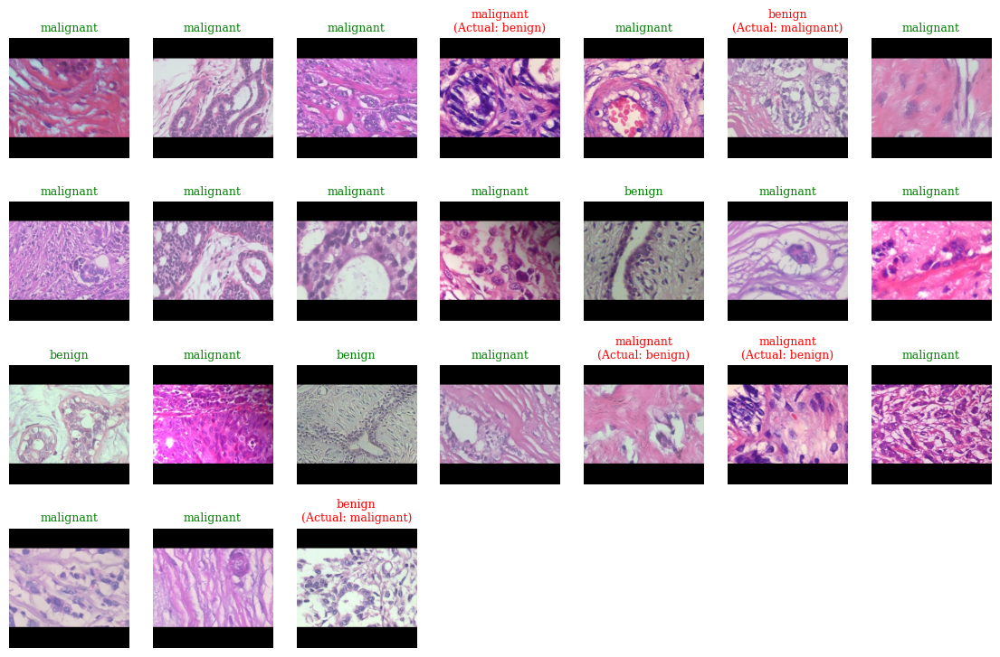

In [46]:
plot_predictions(custom_model)

# Transfert de connaissances

[Transfert de connaissances][trans-learn] est la pratique d'appliquer les connaissances acquises à partir d'une tâche à une autre tâche connexe. Elle est largement utilisée dans les problèmes de vision par ordinateur pour obtenir des performances élevées avec peu de données, en exploitant des modèles pré-entraînés qui ont appris à extraire des caractéristiques à partir de vastes collections d'images (le plus souvent la base de données [ImageNet][imagenet]).

Voyons maintenant comment certaines des architectures de modèles les plus populaires se comportent sur cet ensemble de données :

[trans-learn]: https://en.wikipedia.org/wiki/Transfer_learning
[imagenet]: https://www.image-net.org/


## Modèle avec base MobileNetV3

Papier MobileNetV3: <https://arxiv.org/abs/1905.02244>

In [47]:
pretrained_mobnet_base = tf.keras.applications.MobileNetV3Small(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_mobnet_base.trainable = False

mobnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # MobileNet
    layers.Lambda(tf.keras.applications.mobilenet_v3.preprocess_input),
    pretrained_mobnet_base,
    layers.Dropout(0.5),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(64, activation="relu"),
    layers.Dense(1, activation="sigmoid")
], name="MobileNetV3")
mobnet_model.summary()

Model: "MobileNetV3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness_6 (Random  (None, 224, 224, 3)      0         
 Brightness)                                                     
                                                                 
 random_flip_6 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_6 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 lambda_1 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 MobilenetV3small (Functiona  (None, 576)              939120    
 l)                                                              
                                                       

Epoch 1/100
84/84 [==============================] - 31s 300ms/step - loss: 0.6109 - roc_auc: 0.6483 - binary_accuracy: 0.6753 - val_loss: 0.5512 - val_roc_auc: 0.7869 - val_binary_accuracy: 0.7258 - lr: 5.0000e-04
Epoch 2/100
84/84 [==============================] - 24s 281ms/step - loss: 0.5587 - roc_auc: 0.7265 - binary_accuracy: 0.7185 - val_loss: 0.5102 - val_roc_auc: 0.8059 - val_binary_accuracy: 0.7258 - lr: 5.0000e-04
Epoch 3/100
84/84 [==============================] - 23s 277ms/step - loss: 0.5296 - roc_auc: 0.7669 - binary_accuracy: 0.7379 - val_loss: 0.4755 - val_roc_auc: 0.8347 - val_binary_accuracy: 0.7690 - lr: 5.0000e-04
Epoch 4/100
84/84 [==============================] - 23s 280ms/step - loss: 0.5213 - roc_auc: 0.7771 - binary_accuracy: 0.7419 - val_loss: 0.4719 - val_roc_auc: 0.8425 - val_binary_accuracy: 0.7765 - lr: 5.0000e-04
Epoch 5/100
84/84 [==============================] - 22s 267ms/step - loss: 0.5193 - roc_auc: 0.7763 - binary_accuracy: 0.7494 - val_loss: 0

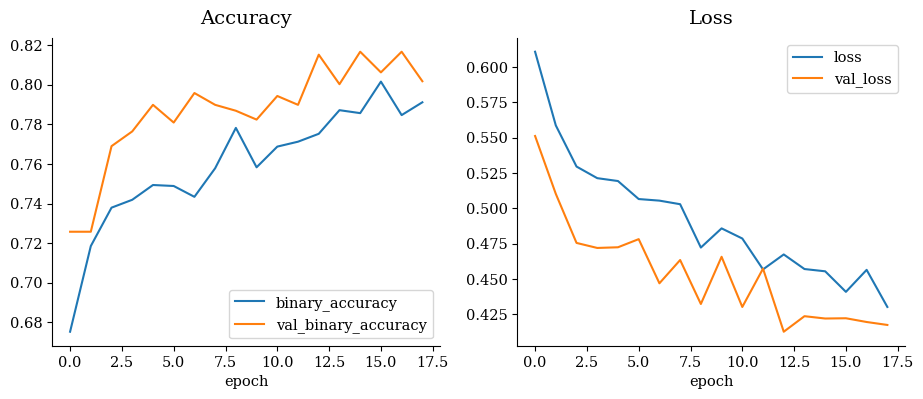

In [48]:
mobnet_history = compile_and_fit_model(mobnet_model)


ROC-AUC:   0.75796
Accuracy:  0.75586
Loss:      0.52153



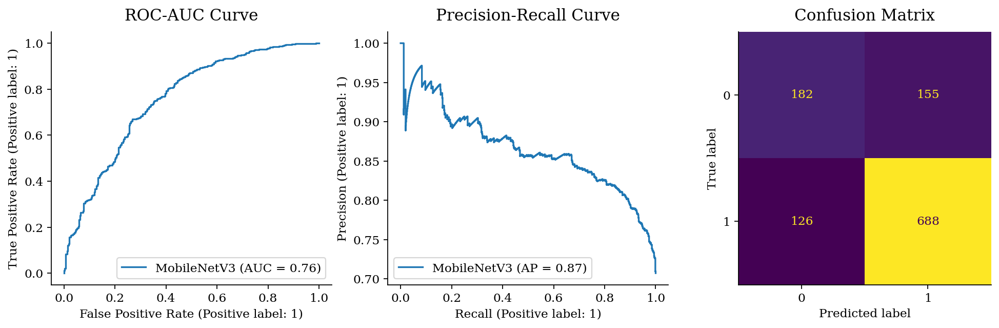

In [49]:
evaluate_model(mobnet_model)

Ce modèle se comporte plutôt mal. Il y a beaucoup de *faux négatifs (123)*. Cela signifie que de nombreuses femmes malades seraient induites en erreur en pensant qu'elles sont en bonne santé.

1/1 [==============================] - 0s 174ms/step
Predicted: [1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 0 1 1 1 1 1 1 0]
Actual:    [1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1]


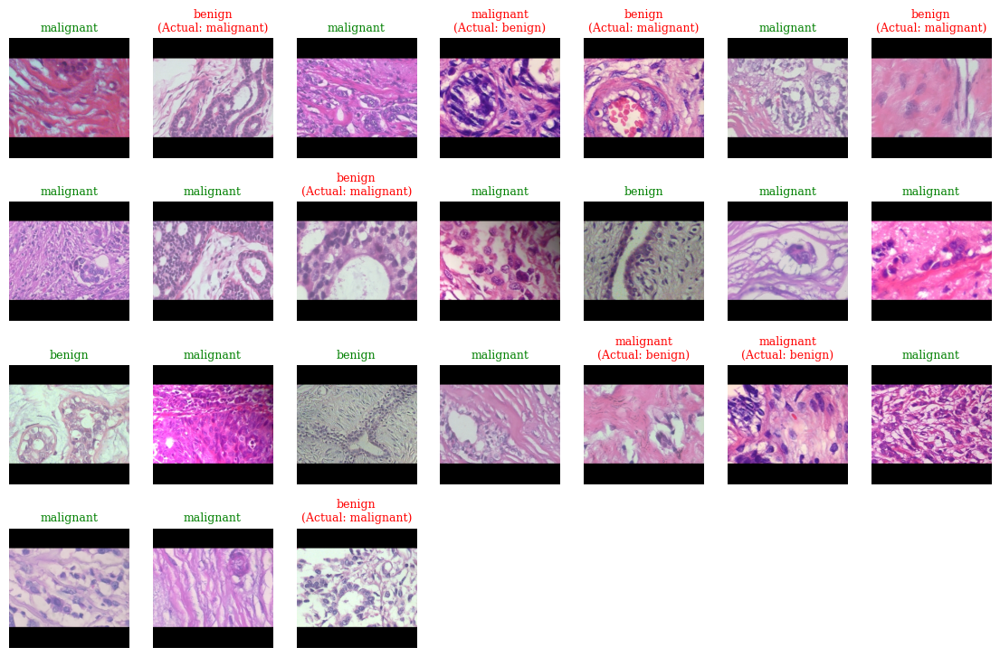

In [50]:
plot_predictions(mobnet_model)

## Modèle avec base EfficientNetB1

Papier EfficientNet: <https://arxiv.org/abs/1905.11946>

In [51]:
pretrained_efficientnet_base = tf.keras.applications.efficientnet_v2.EfficientNetV2B1(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_efficientnet_base.trainable = False

efficientnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # EfficientNet
    pretrained_efficientnet_base,
    layers.Dropout(0.5),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dense(1, activation="sigmoid")
], name="EfficientNetB1")
efficientnet_model.summary()

Model: "EfficientNetB1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness_7 (Random  (None, 224, 224, 3)      0         
 Brightness)                                                     
                                                                 
 random_flip_7 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_7 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 efficientnetv2-b1 (Function  (None, 1280)             6931124   
 al)                                                             
                                                                 
 dropout_16 (Dropout)        (None, 1280)              0         
                                                    

Epoch 1/100
84/84 [==============================] - 125s 1s/step - loss: 0.5243 - roc_auc: 0.7692 - binary_accuracy: 0.7399 - val_loss: 0.4514 - val_roc_auc: 0.8986 - val_binary_accuracy: 0.7779 - lr: 5.0000e-04
Epoch 2/100
84/84 [==============================] - 107s 1s/step - loss: 0.4325 - roc_auc: 0.8557 - binary_accuracy: 0.8076 - val_loss: 0.4019 - val_roc_auc: 0.9239 - val_binary_accuracy: 0.8167 - lr: 5.0000e-04
Epoch 3/100
84/84 [==============================] - 108s 1s/step - loss: 0.4074 - roc_auc: 0.8741 - binary_accuracy: 0.8130 - val_loss: 0.3588 - val_roc_auc: 0.9277 - val_binary_accuracy: 0.8450 - lr: 5.0000e-04
Epoch 4/100
84/84 [==============================] - 106s 1s/step - loss: 0.3828 - roc_auc: 0.8890 - binary_accuracy: 0.8265 - val_loss: 0.3723 - val_roc_auc: 0.9349 - val_binary_accuracy: 0.8286 - lr: 5.0000e-04
Epoch 5/100
84/84 [==============================] - 106s 1s/step - loss: 0.3767 - roc_auc: 0.8945 - binary_accuracy: 0.8319 - val_loss: 0.3539 - va

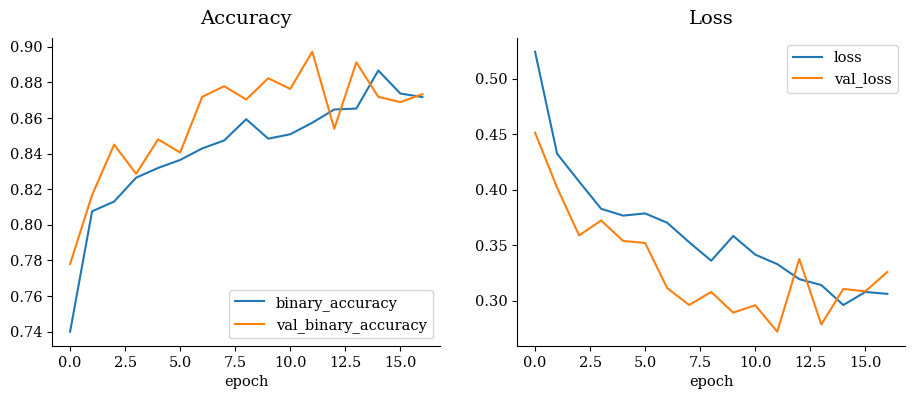

In [52]:
efficientnet_history = compile_and_fit_model(efficientnet_model)


ROC-AUC:   0.88146
Accuracy:  0.83319
Loss:      0.41100



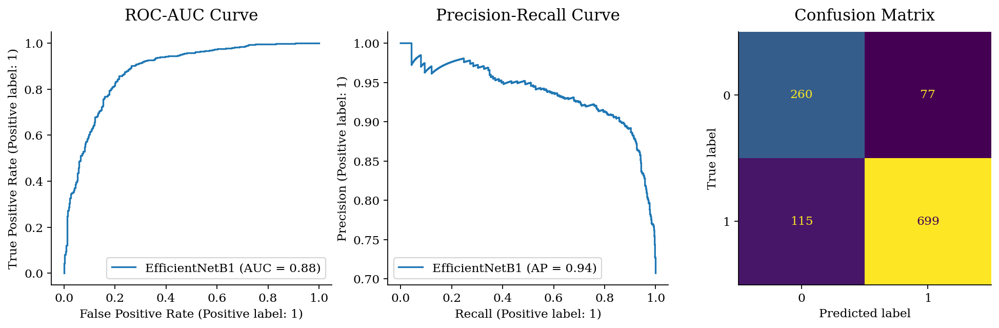

In [53]:
evaluate_model(efficientnet_model)

Ce modèle est très prometteur. Il a obtenu un score ROC-AUC de test élevé. Cependant, le nombre de *faux négatifs (125)* n'est pas très flatteur. Il y a de la place pour l'amélioration, peut-être en s'entraînant sur plus de données et à une résolution d'image plus élevée.

1/1 [==============================] - 1s 959ms/step
Predicted: [1 0 1 0 0 0 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 0]
Actual:    [1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1]


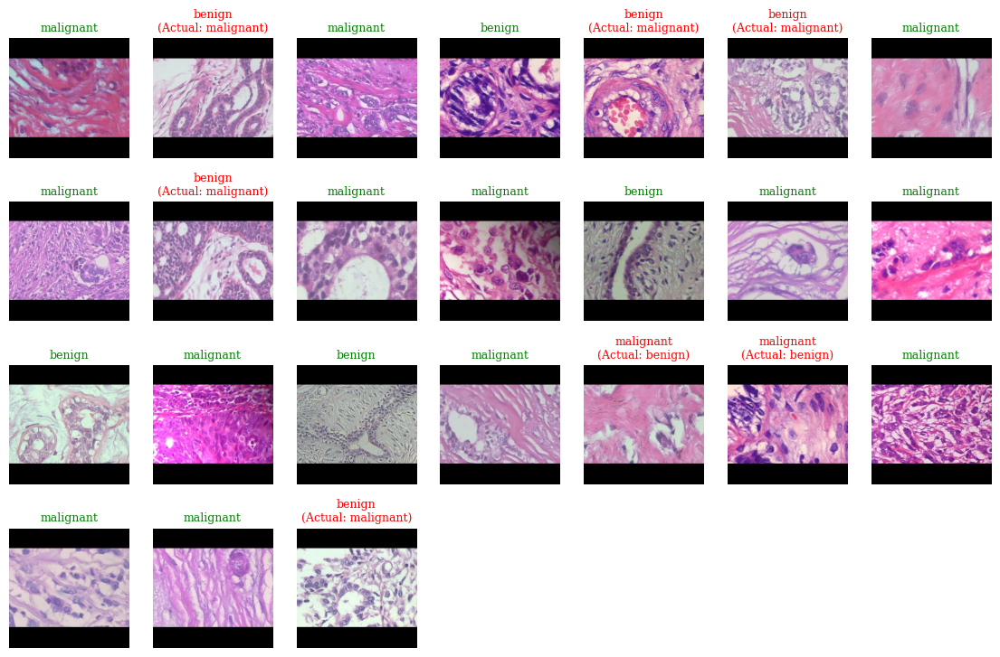

In [54]:
plot_predictions(efficientnet_model)

## Modèle avec base VGG16

Papier VGG: <https://arxiv.org/abs/1409.1556>

In [55]:
pretrained_vgg16_base = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_vgg16_base.trainable = False

vgg16_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # VGG16
    layers.Lambda(tf.keras.applications.vgg16.preprocess_input),
    pretrained_vgg16_base,
    layers.Dropout(0.5),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.2),
    layers.Dense(32, activation="relu"),
    layers.Dense(1, activation="sigmoid")
], name="VGG16")
vgg16_model.summary()

Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness_8 (Random  (None, 224, 224, 3)      0         
 Brightness)                                                     
                                                                 
 random_flip_8 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_8 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 lambda_2 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 dropout_18 (Dropout)        (None, 512)               0     

Epoch 1/100
84/84 [==============================] - 572s 7s/step - loss: 0.9145 - roc_auc: 0.5836 - binary_accuracy: 0.6231 - val_loss: 0.5358 - val_roc_auc: 0.8125 - val_binary_accuracy: 0.7273 - lr: 5.0000e-04
Epoch 2/100
84/84 [==============================] - 567s 7s/step - loss: 0.6066 - roc_auc: 0.6844 - binary_accuracy: 0.6753 - val_loss: 0.5537 - val_roc_auc: 0.8293 - val_binary_accuracy: 0.7824 - lr: 5.0000e-04
Epoch 3/100
84/84 [==============================] - 567s 7s/step - loss: 0.5772 - roc_auc: 0.7275 - binary_accuracy: 0.7066 - val_loss: 0.5408 - val_roc_auc: 0.8417 - val_binary_accuracy: 0.7854 - lr: 5.0000e-04
Epoch 4/100
84/84 [==============================] - 568s 7s/step - loss: 0.5392 - roc_auc: 0.7562 - binary_accuracy: 0.7250 - val_loss: 0.5516 - val_roc_auc: 0.8550 - val_binary_accuracy: 0.7973 - lr: 5.0000e-04
Epoch 5/100
84/84 [==============================] - 569s 7s/step - loss: 0.5393 - roc_auc: 0.7675 - binary_accuracy: 0.7310 - val_loss: 0.5187 - va

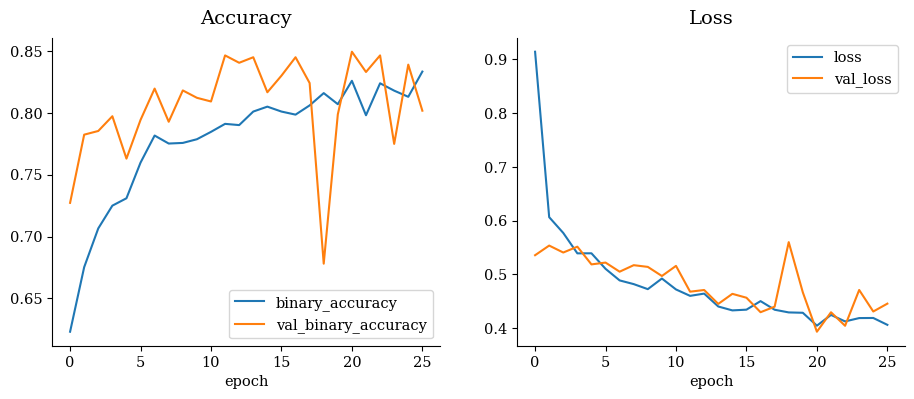

In [56]:
vgg16_history = compile_and_fit_model(vgg16_model)


ROC-AUC:   0.85184
Accuracy:  0.82624
Loss:      0.43844



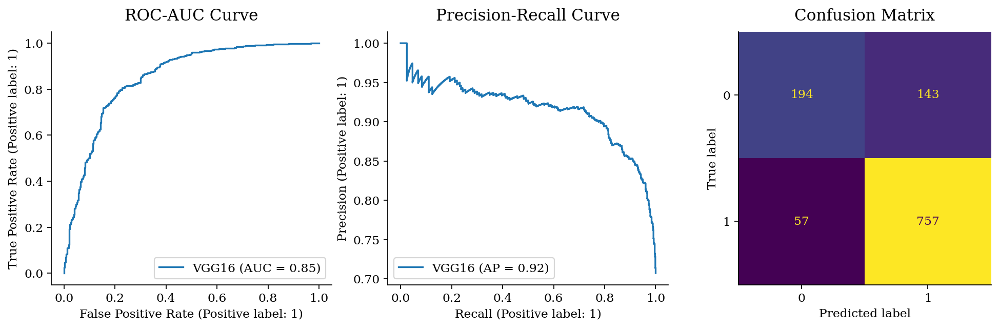

In [57]:
evaluate_model(vgg16_model)

1/1 [==============================] - 1s 1s/step
Predicted: [1 1 1 0 1 1 1 1 1 0 1 0 1 1 0 1 0 1 1 1 1 1 1 0]
Actual:    [1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1]


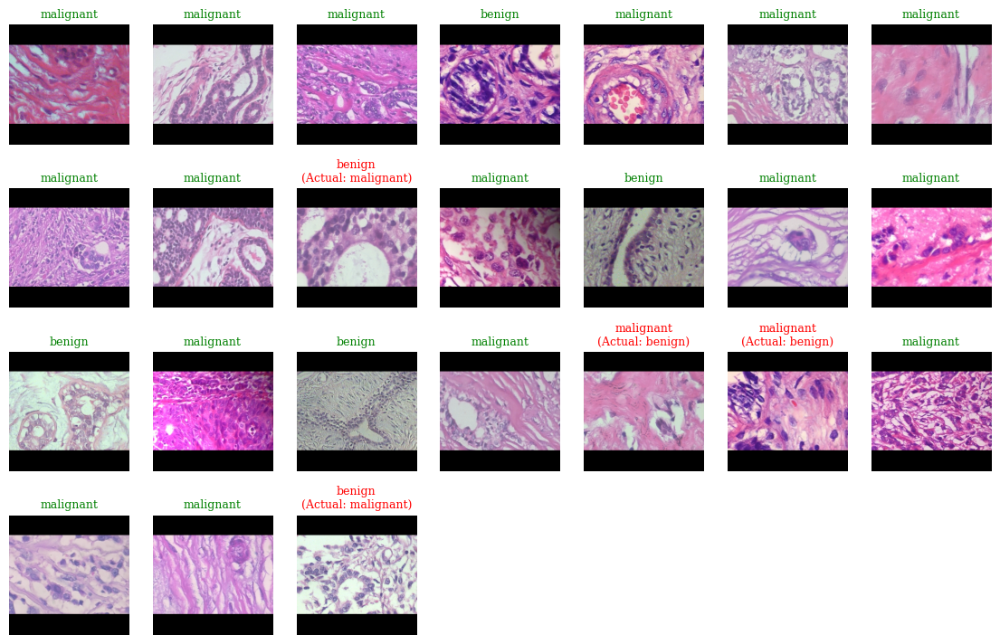

In [58]:
plot_predictions(vgg16_model)

## Modèle avec base ResNet50V2

Papier ResNetV2: <https://arxiv.org/abs/1603.05027>

In [59]:
pretrained_resnet_base = tf.keras.applications.resnet_v2.ResNet50V2(
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    weights="imagenet",
    pooling="avg",
)
pretrained_resnet_base.trainable = False

resnet_model = tf.keras.Sequential([
    layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),
    # Data augmentation
    layers.RandomBrightness(0.2, seed=SEED),
    layers.RandomFlip(seed=SEED),
    layers.RandomRotation(0.2, seed=SEED),
    # ResNet
    layers.Lambda(tf.keras.applications.resnet_v2.preprocess_input),
    pretrained_resnet_base,
    layers.Dropout(0.5),
    # Fully connected layers
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(32, activation="relu"),
    layers.Dense(1, activation="sigmoid")
], name="ResNet50V2")
resnet_model.summary()

Model: "ResNet50V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_brightness_9 (Random  (None, 224, 224, 3)      0         
 Brightness)                                                     
                                                                 
 random_flip_9 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_9 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 lambda_3 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 dropout_20 (Dropout)        (None, 2048)              0

Epoch 1/100
84/84 [==============================] - 71s 806ms/step - loss: 0.5687 - roc_auc: 0.7311 - binary_accuracy: 0.7325 - val_loss: 0.4519 - val_roc_auc: 0.8710 - val_binary_accuracy: 0.7839 - lr: 5.0000e-04
Epoch 2/100
84/84 [==============================] - 67s 804ms/step - loss: 0.4729 - roc_auc: 0.8231 - binary_accuracy: 0.7837 - val_loss: 0.3951 - val_roc_auc: 0.8943 - val_binary_accuracy: 0.8450 - lr: 5.0000e-04
Epoch 3/100
84/84 [==============================] - 66s 789ms/step - loss: 0.4401 - roc_auc: 0.8519 - binary_accuracy: 0.8091 - val_loss: 0.3945 - val_roc_auc: 0.8941 - val_binary_accuracy: 0.8316 - lr: 5.0000e-04
Epoch 4/100
84/84 [==============================] - 125s 2s/step - loss: 0.4112 - roc_auc: 0.8751 - binary_accuracy: 0.8155 - val_loss: 0.4037 - val_roc_auc: 0.8929 - val_binary_accuracy: 0.8182 - lr: 5.0000e-04
Epoch 5/100
84/84 [==============================] - 212s 3s/step - loss: 0.3869 - roc_auc: 0.8873 - binary_accuracy: 0.8374 - val_loss: 0.353

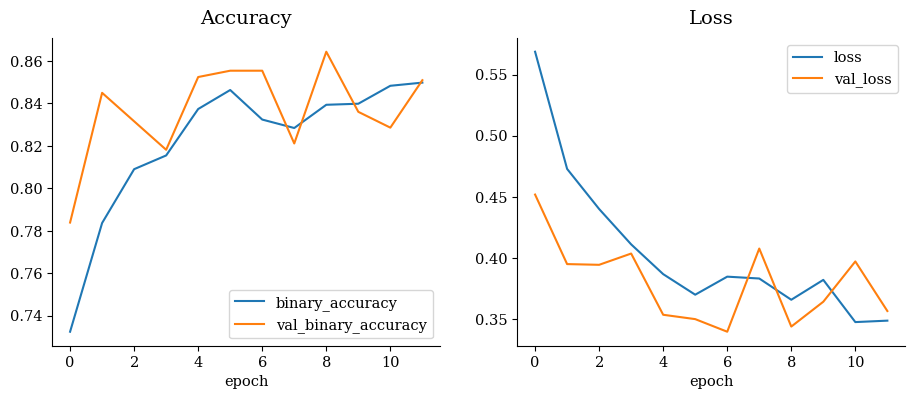

In [60]:
resnet_history = compile_and_fit_model(resnet_model)


ROC-AUC:   0.82516
Accuracy:  0.79844
Loss:      0.46502



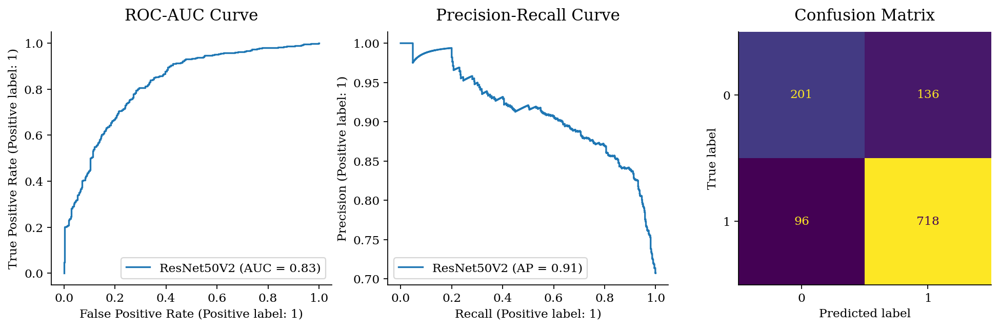

In [61]:
evaluate_model(resnet_model)

Trop de patients ayant besoin d'une attention médicale seraient trompés en pensant qu'ils sont en bonne santé. Cela est inacceptable.

1/1 [==============================] - 1s 573ms/step
Predicted: [1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 1 1 1 1 1 1 0]
Actual:    [1 1 1 0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 1 1]


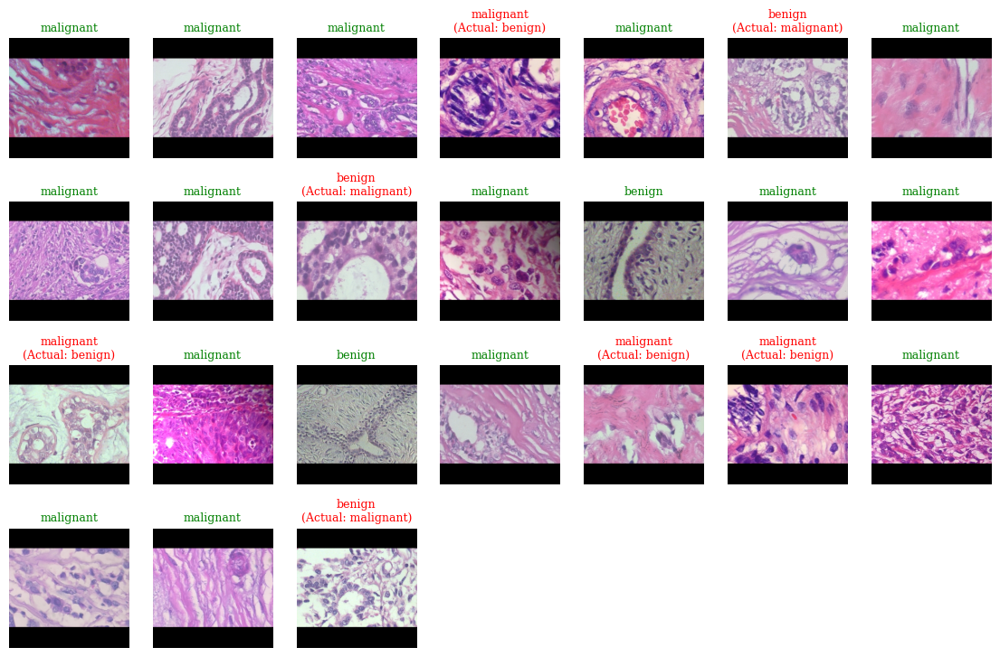

In [62]:
plot_predictions(resnet_model)

# Évaluation du modèle

Le modèle EfficientNetB1 a atteint le score de ROC-AUC le plus élevé.

Le modèle CNN personnalisé a obtenu la plus faible perte et la précision la plus élevée sur l'ensemble de données de test.

In [63]:
fitted_models = [custom_model, mobnet_model, efficientnet_model, vgg16_model,
                 resnet_model]
test_metrics = pd.DataFrame(
    {model.name: model.evaluate(test_ds, verbose=0) for model in fitted_models},
    index=["Loss", "ROC-AUC", "Accuracy"]
)
test_metrics.style.highlight_min(color="red", axis=None)\
                  .highlight_max(color="blue", axis=None)

,CustomCNN,MobileNetV3,EfficientNetB1,VGG16,ResNet50V2
Loss,0.468095,0.521534,0.411005,0.438440,0.465024
ROC-AUC,0.851010,0.757962,0.881457,0.851842,0.825159
Accuracy,0.850565,0.755864,0.833189,0.826238,0.798436


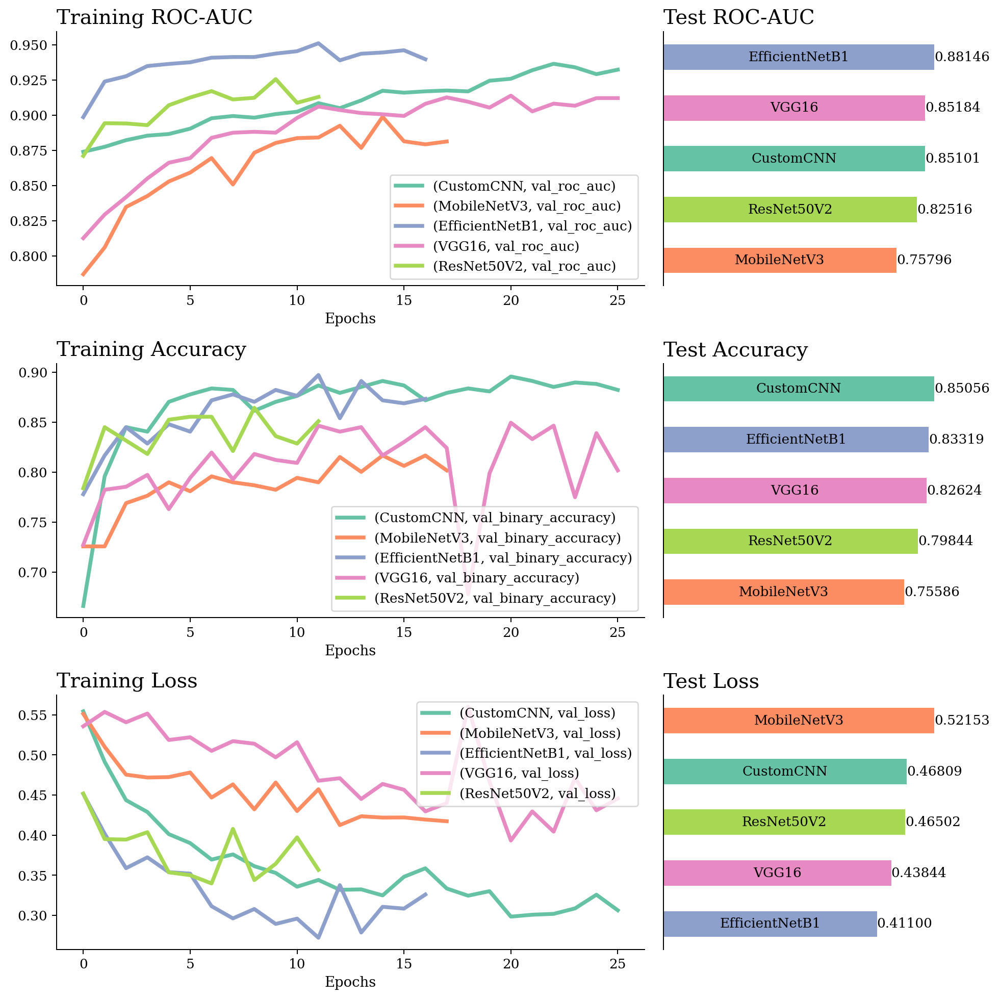

In [64]:
# Process training metrics
hist_list = [custom_history, mobnet_history, efficientnet_history,
             vgg16_history, resnet_history]
train_metrics = pd.concat([pd.DataFrame(hist.history) for hist in hist_list],
                          axis=1, keys=[hist.model.name for hist in hist_list])
train_metrics.head()
color_dict = dict(zip(test_metrics, plt.colormaps["Set2"].colors))

# Plot training and test metrics
fig, axes = plt.subplot_mosaic("\naab\nccd\neef\n", figsize=(11, 11),
                               dpi=180, tight_layout=True)
for ax, metric in zip([axes["a"], axes["c"], axes["e"]],
                      ["val_roc_auc", "val_binary_accuracy", "val_loss"]):
    data_ = train_metrics.filter(like=metric)
    data_.plot(ax=ax, lw=3, color=[color_dict[col]
                                   for col in data_.columns.levels[0]])
    ax.set_xlabel("Epochs", size=11)

for ax, metric in zip([axes["b"], axes["d"], axes["f"]],
                      ["ROC-AUC", "Accuracy", "Loss"]):
    data_ = test_metrics.loc[metric].sort_values()
    data_.plot.barh(ax=ax, color=[color_dict[col] for col in data_.index])
    ax.bar_label(ax.containers[0], [f"{x:.5f}" for x in ax.containers[0].datavalues])
    ax.bar_label(ax.containers[0], data_.index, label_type="center")
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.spines["bottom"].set_visible(False)

titles = ["Training ROC-AUC", "Test ROC-AUC", "Training Accuracy", "Test Accuracy",
          "Training Loss", "Test Loss"]
for ax, title in zip(axes.values(), titles):
    ax.set_title(title, size=16, loc="left")
    
axes["a"].legend(title="")
axes["c"].legend(title="")
axes["e"].legend(title="");